In [1]:
!pip install  datasets transformers shap
!pip install bertviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 493.7/493.7 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 106.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 59.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 44.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 35.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 50.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

In [2]:
import datasets
import pandas as pd
import transformers

import shap

# load the emotion dataset
dataset = datasets.load_dataset("emotion", split="train")
data = pd.DataFrame({"text": dataset["text"], "emotion": dataset["label"]})

Extracting data files:   0%|          | 0/3 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/16000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/2000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/2000 [00:00<?, ? examples/s]

In [3]:
# load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained(
    "nateraw/bert-base-uncased-emotion", use_fast=True
)
model = transformers.AutoModelForSequenceClassification.from_pretrained(
    "nateraw/bert-base-uncased-emotion",output_attentions=True
).cuda()

# build a pipeline object to do predictions
pred = transformers.pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=0,
    return_all_scores=True,
)

`return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.


In [10]:
pred("I used to hate you, but now it's the opposite, I'm deeply in love with you.")

[[{'label': 'sadness', 'score': 0.01092946995049715},
  {'label': 'joy', 'score': 0.0700501799583435},
  {'label': 'love', 'score': 0.9086285829544067},
  {'label': 'anger', 'score': 0.007231352385133505},
  {'label': 'fear', 'score': 0.0012634103186428547},
  {'label': 'surprise', 'score': 0.0018970733508467674}]]

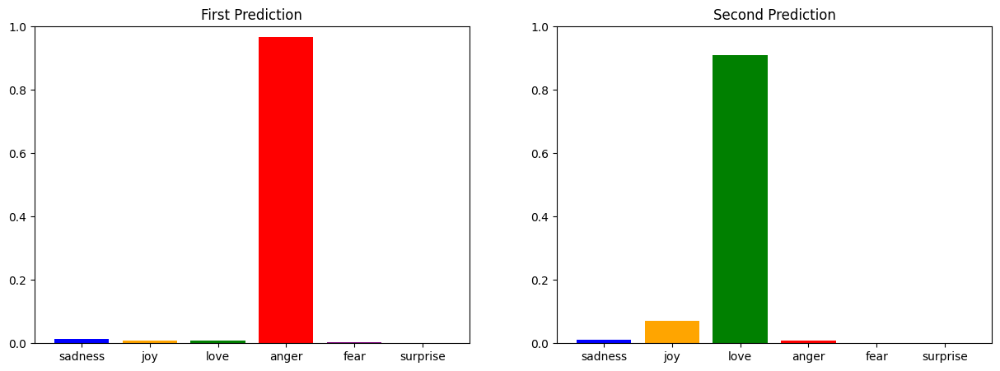

In [12]:
import matplotlib.pyplot as plt

# Data from the images provided
data1 = {
    'label': ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise'],
    'score': [0.01361523579108715, 0.0078849196434021, 0.007745984476059675, 0.96723048515051, 0.0022734894882876, 0.0012483270838856697]
}
data2 = {
    'label': ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise'],
    'score': [0.01092946995049715, 0.070501799583435, 0.9086285829544067, 0.00723135285133505, 0.001263410318642547, 0.0018970733508467674]
}

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Plot for the first image data
axs[0].bar(data1['label'], data1['score'], color=['blue', 'orange', 'green', 'red', 'purple', 'brown'])
axs[0].set_title("First Prediction")
axs[0].set_ylim(0, 1)

# Plot for the second image data
axs[1].bar(data2['label'], data2['score'], color=['blue', 'orange', 'green', 'red', 'purple', 'brown'])
axs[1].set_title("Second Prediction")
axs[1].set_ylim(0, 1)

# Show plot
plt.show()


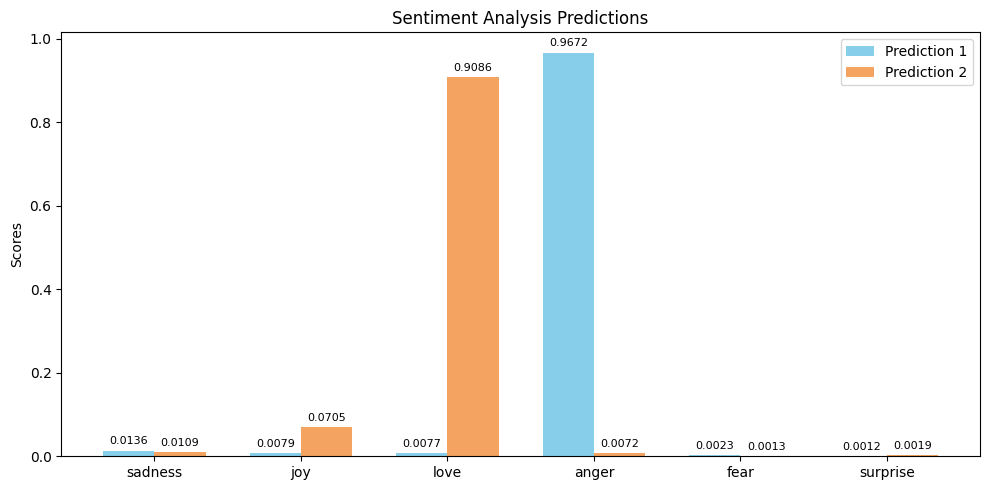

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# Data extracted from the images
emotions = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
scores1 = [0.01361523579108715, 0.0078849196434021, 0.007745984476059675, 0.96723048515051, 0.0022734894882876, 0.0012483270838856697]
scores2 = [0.01092946995049715, 0.070501799583435, 0.9086285829544067, 0.00723135285133505, 0.001263410318642547, 0.0018970733508467674]

x = np.arange(len(emotions))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(10, 5))
rects1 = ax.bar(x - width/2, scores1, width, label='Prediction 1', color='skyblue')
rects2 = ax.bar(x + width/2, scores2, width, label='Prediction 2', color='sandybrown')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Sentiment Analysis Predictions')
ax.set_xticks(x)
ax.set_xticklabels(emotions)
ax.legend()

# Function to attach a text label above each bar
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(round(height, 4)),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=8)

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()


In [ ]:
explainer = shap.Explainer(pred)
shap_values = explainer(data["text"][10:20])

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|█████     | 5/10 [00:12<00:03,  1.53it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|█████████ | 9/10 [00:25<00:02,  2.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 11it [00:36,  4.60s/it]


In [ ]:
data[:]

,text,emotion
0,i didnt feel humiliated,0
1,i can go from feeling so hopeless to so damned...,0
2,im grabbing a minute to post i feel greedy wrong,3
3,i am ever feeling nostalgic about the fireplac...,2
4,i am feeling grouchy,3
...,...,...
15995,i just had a very brief time in the beanbag an...,0
15996,i am now turning and i feel pathetic that i am...,0
15997,i feel strong and good overall,1
15998,i feel like this was such a rude comment and i...,3


In [ ]:
shap.plots.text(shap_values)

In [ ]:
shap.plots.text(shap_values[:, :, "anger"])

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


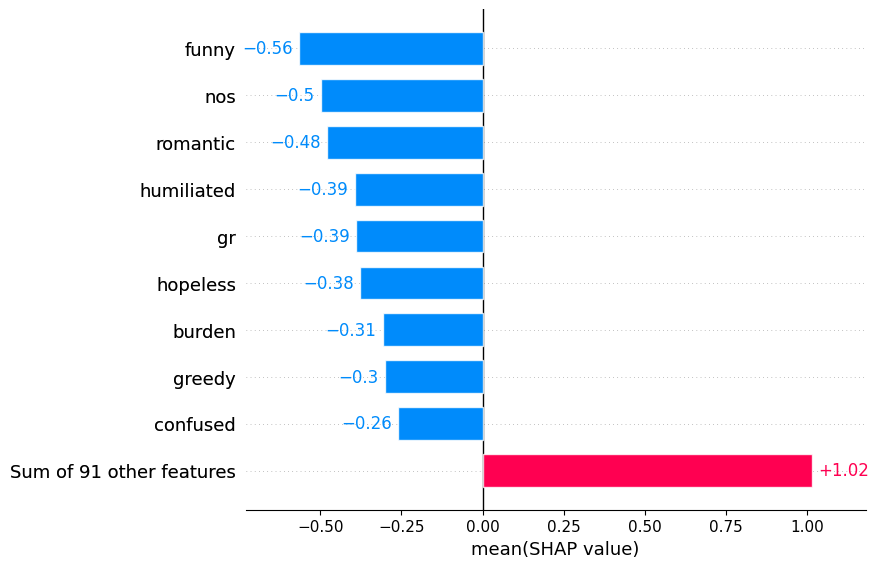

In [ ]:
shap.plots.bar(shap_values[:, :, "joy"].mean(0))

In [ ]:
!pip install bertviz

In [ ]:
from bertviz import head_view, model_view
from transformers import BertTokenizer, BertModel

sentence_a = "i have the feeling she was amused and delighted"
#sentence_b = "The cat lay on the rug"
inputs = tokenizer(sentence_a, return_tensors='pt')
input_ids = inputs['input_ids'].cuda()
token_type_ids = inputs['token_type_ids'].cuda()
attention = model(input_ids, token_type_ids=token_type_ids)[-1]
#sentence_b_start = token_type_ids[0].tolist().index(1)
input_id_list = input_ids[0].tolist() # Batch index 0
tokens = tokenizer.convert_ids_to_tokens(input_id_list)

In [ ]:
head_view(attention, tokens)

<IPython.core.display.Javascript object>

In [ ]:
model_view(attention, tokens)

<IPython.core.display.Javascript object>